In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.compose import TransformedTargetRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold

**小さなデータセットの用意**

以前も利用した回帰のデータセットを用意します。

House Prices: Advanced Regression Techniques

この中のtrain.csvをダウンロードし、目的変数としてSalePrice、説明変数として、GrLivAreaとYearBuiltを使います。

train.csvを学習用（train）8割、検証用（val）2割に分割してください。

In [2]:
train = pd.read_csv("train.csv")[["GrLivArea", "YearBuilt"]]
target = pd.read_csv("train.csv")["SalePrice"]

X_train, X_val, y_train, y_val = train_test_split(train, target, test_size=0.2, random_state=0)

##  はじめに簡単にデータの確認

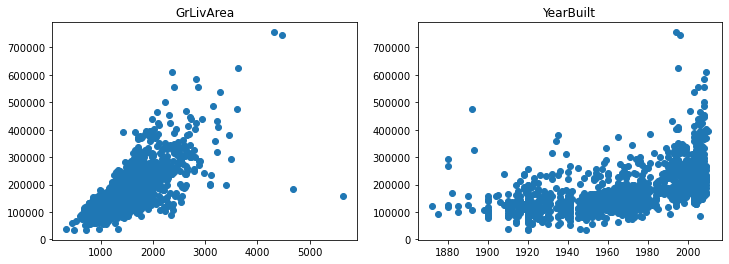

In [3]:
fig, axes = plt.subplots(1,2, figsize=(12,4))
axes[0].scatter(train["GrLivArea"], target)
axes[0].set_title("GrLivArea")
axes[1].scatter(train["YearBuilt"], target)
axes[1].set_title("YearBuilt")
plt.show()

## 【問題1】ブレンディングのスクラッチ実装
ブレンディング をスクラッチ実装し、単一モデルより精度があがる例を 最低3つ 示してください。

精度があがるとは、検証用データに対する平均二乗誤差（MSE）が小さくなることを指します。


### 手法によるブレンディング

In [4]:
np.random.seed(0)

#データ標準化
sc = StandardScaler()
sc.fit(np.concatenate([X_train, X_val]))
X_train = sc.transform(X_train)
X_val = sc.transform(X_val)

#学習(線形回帰 ＆ SVM ＆ 決定木)
lr = LinearRegression().fit(X_train, y_train)
svr = SVR().fit(X_train, y_train)
tree = DecisionTreeRegressor().fit(X_train, y_train)

#予測
lr_pred  = lr.predict(X_val)
svr_pred = svr.predict(X_val)
tree_pred = tree.predict(X_val)

#ブレンディング
blending_all_pred = np.array([lr_pred, svr_pred, tree_pred]).mean(axis=0) #全部混ぜ
blending_lr_and_tree_pred = np.array([lr_pred, tree_pred]).mean(axis=0) #線形回帰 ＆ 決定木

#評価
lr_score = mean_squared_error(y_val, lr_pred)
svr_score = mean_squared_error(y_val, svr_pred)
tree_score = mean_squared_error(y_val, tree_pred)

blending_all_score = mean_squared_error(y_val, blending_all_pred)
blending_lr_and_tree_score = mean_squared_error(y_val, blending_lr_and_tree_pred)

results = pd.DataFrame(data=[lr_score, svr_score, tree_score, blending_all_score, blending_lr_and_tree_score],
                       index=["LinearRegression", "svr", "tree", "blending_all", "blending_lr_and_tree"],
                       columns=["mean_squared_error"])

display(results.sort_values(by="mean_squared_error"))

,mean_squared_error
blending_lr_and_tree,2.589777e+09
blending_all,2.842546e+09
LinearRegression,2.942067e+09
tree,3.320593e+09
svr,7.221523e+09


線形回帰 ＆ 決定木のモデルの予測をブレンディングしたケースが最も良いスコアとなった  
線形回帰 ＆ 決定木の予測値のブレンディングの比率を変化させてみる

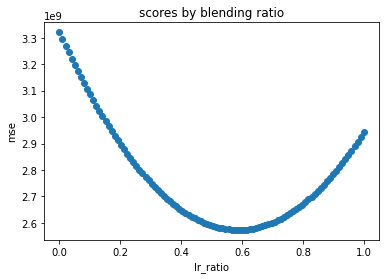

best mse score: 2.573e+09
lr ratio: 0.586
tree ratio: 0.414


In [5]:
lr_ratio = np.linspace(0,1,100)
scores = []
for p in lr_ratio:
    y_blending = p * lr_pred  + (1-p) * tree_pred
    score = mean_squared_error(y_val, y_blending)
    scores.append(score)

plt.scatter(lr_ratio, scores)
plt.ylabel("mse")
plt.xlabel("lr_ratio")
plt.title("scores by blending ratio")
plt.show()

min_value = min(scores)
min_index = scores.index(min_value)
min_ratio = lr_ratio[min_index]

print("best mse score: {:.3e}\nlr ratio: {:.3f}\ntree ratio: {:.3f}".format(min_value, min_ratio, 1-min_ratio))

### ハイパーパラメータによるブレンディング

In [6]:
#データ標準化
sc = StandardScaler()
sc.fit(np.concatenate([X_train, X_val]))
X_train = sc.transform(X_train)
X_val = sc.transform(X_val)

#学習
svr1 = SVR(kernel="linear", C=1, epsilon=0.1, coef0=0.0).fit(X_train, y_train)
svr2 = SVR(kernel="poly", C=10, epsilon=0.1, coef0=0.0).fit(X_train, y_train)
svr3 = SVR(kernel="rbf", C=1, epsilon=0.1, coef0=0.0).fit(X_train, y_train)

#予測
svr1_pred  = svr1.predict(X_val)
svr2_pred = svr2.predict(X_val)
svr3_pred = svr3.predict(X_val)
blending_pred = np.array([svr1_pred, svr2_pred, svr3_pred]).mean(axis=0)

#評価
svr1_score = mean_squared_error(y_val, svr1_pred)
svr2_score = mean_squared_error(y_val, svr2_pred)
svr3_score = mean_squared_error(y_val, svr3_pred)
blending_score = mean_squared_error(y_val, blending_pred)

results = pd.DataFrame(data=[svr1_score, svr2_score, svr3_score, blending_score],
                       index=["svr1", "svr2", "svr3", "blending_pred"],
                       columns=["params changed mse"])

display(results.sort_values(by="params changed mse"))

,params changed mse
blending_pred,6.779410e+09
svr1,7.095040e+09
svr3,7.221523e+09
svr2,8.792671e+09


### 入力データの前処理の方法によるブレンディング

In [7]:
#データ再読込
train = pd.read_csv("train.csv")[["GrLivArea", "YearBuilt"]]
target = pd.read_csv("train.csv")["SalePrice"]

X_train, X_val, y_train, y_val = train_test_split(train, target, test_size=0.2, random_state=0)

In [9]:
#標準化
sc = StandardScaler()
sc.fit(np.concatenate([X_train, X_val]))
X_train_std = sc.transform(X_train)
X_val_std = sc.transform(X_val)

#対数変換
X_train_log = X_train.apply(np.log1p)
X_val_log = X_val.apply(np.log1p)

#clipping
p01 = X_train.quantile(0.01)
p99 = X_val.quantile(0.99)
X_train_clip = X_train.clip(p01, p99, axis=1)
X_val_clip = X_val.clip(p01, p99, axis=1)

#学習(LinearRegression)
lr_std = LinearRegression().fit(X_train_std, y_train)
lr_log = LinearRegression().fit(X_train_log, y_train)
#lr_clip = LinearRegression().fit(X_train_clip, y_train)

#予測
lr_std_pred  = lr_std.predict(X_val_std)
lr_log_pred  = lr_log.predict(X_val_log)
#lr_clip_pred = lr_clip.predict(X_val_clip)
blending_pred = np.array([lr_std_pred, lr_log_pred]).mean(axis=0)

#評価
lr_std_score = mean_squared_error(y_val, lr_std_pred)
lr_log_score = mean_squared_error(y_val, lr_log_pred)
#lr_clip_score = mean_squared_error(y_val, lr_clip_pred)
blending_score = mean_squared_error(y_val, blending_pred)

results = pd.DataFrame(data=[lr_std_score, lr_log_score,  blending_score],
                       index=["LR standard data", "LR log-scaler data",  "blending_pred"],
                       columns=["data changed mse"])

display(results.sort_values(by="data changed mse"))

,data changed mse
blending_pred,2.843176e+09
LR log-scaler data,2.900008e+09
LR standard data,2.942067e+09


## 【問題2】バギングのスクラッチ実装
バギング をスクラッチ実装し、単一モデルより精度があがる例を 最低1つ 示してください。

問題１で最も精度が良かった線形回帰を用いて比較検証を行う

In [10]:
#単一で学習したときのスコアを計測
X_train, X_val, y_train ,y_val = train_test_split(train, target, test_size=0.2, random_state=2)
lr = LinearRegression().fit(X_train, y_train)
y_pred = lr.predict(X_val)
score = mean_squared_error(y_val, y_pred)
print("LinearRegression-model single learning score is {:.3e}".format(score))

LinearRegression-model single learning score is 1.873e+09


In [11]:
#バギングで学習
num_iter = 200
X_train, X_val, y_train ,y_val = train_test_split(train, target, test_size=0.2, random_state=2)

bagging_pred = np.zeros([num_iter, len(X_val)])

for i in range(num_iter):
    X_train_bag, _, y_train_bag ,_ = train_test_split(X_train, y_train, test_size=0.2, shuffle=True)
    lr = LinearRegression().fit(X_train_bag, y_train_bag)
    y_pred = lr.predict(X_val)
    bagging_pred[i, :] = y_pred

mean_bagging_pred = bagging_pred.mean(axis=0)
score = mean_squared_error(y_val, mean_bagging_pred)
print("baggin mse score is: {:.3e}".format(score))

baggin mse score is: 1.869e+09


## 【問題3】スタッキングのスクラッチ実装
スタッキング をスクラッチ実装し、単一モデルより精度があがる例を 最低1つ 示してください。

《学習時》

（ステージ $0$ ）

学習データを $K_0$ 個に分割する。
分割した内の $(K_0 - 1)$ 個をまとめて学習用データ、残り $1$ 個を推定用データとする組み合わせが $K_0$ 個作れる。
あるモデルのインスタンスを $K_0$ 個用意し、異なる学習用データを使い学習する。
それぞれの学習済みモデルに対して、使っていない残り $1$ 個の推定用データを入力し、推定値を得る。（これをブレンドデータと呼ぶ）
さらに、異なるモデルのインスタンスも $K_0$ 個用意し、同様のことを行う。モデルが $M_0$ 個あれば、 $M_0$ 個のブレンドデータが得られる。

（ステージ $n$ ）

ステージ $n-1$ のブレンドデータを$M_{n-1}$ 次元の特徴量を持つ学習用データと考え、 $K_n$ 個に分割する。以下同様である。

（ステージ $N$ ）＊最後のステージ

ステージ $N-1$ の $M_{N-1}$ 個のブレンドデータを$M_{N-1}$ 次元の特徴量の入力として、1種類のモデルの学習を行う。これが最終的な推定を行うモデルとなる。

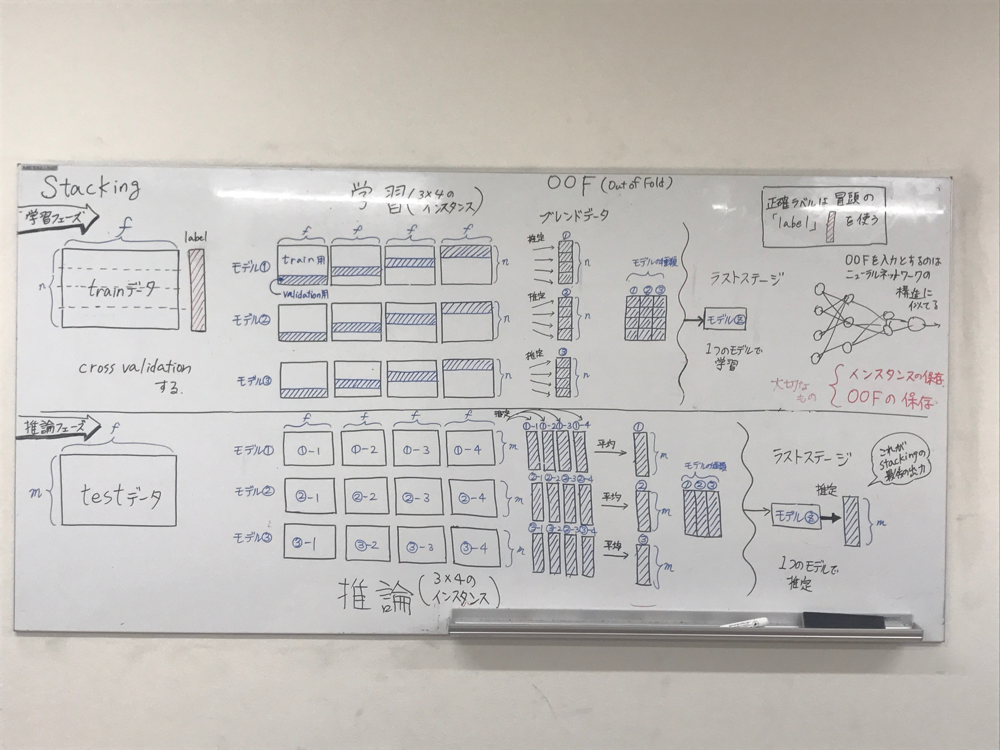

In [12]:
#データ読み込み
train = pd.read_csv("train.csv")[["GrLivArea", "YearBuilt"]]
target = pd.read_csv("train.csv")["SalePrice"]

X_train, X_test, y_train, y_test = train_test_split(train, target, test_size=0.2, random_state=0)

まずは単一モデルで学習・予測・評価

In [37]:
lr = LinearRegression()
lr.fit(X_train, y_train)
print("mse: {:.3e}".format(mean_squared_error(y_test, lr.predict(X_test))))

mse: 2.942e+09


学習フェーズ

In [38]:

#学習モデルを定義
model_list = [LinearRegression, SVR, DecisionTreeRegressor]

# クロスバリデーション
K = 4
kf = KFold(n_splits=K, shuffle=True, random_state=0)

#インスタンスを保存する辞書型の定義
instance_dict = {i:[] for i in range(len(model_list))}
scores = np.zeros([len(model_list), K])

#ブレンディングデータの形を定義
blend_data = np.zeros([len(model_list), len(y_train)])

#スタッキング
for i, model in enumerate(model_list):
    for j, (tr_idx, va_idx) in enumerate(kf.split(X_train)):
        tr_x, va_x = X_train.iloc[tr_idx], X_train.iloc[va_idx]
        tr_y, va_y = y_train.iloc[tr_idx], y_train.iloc[va_idx]
        
        ins = model().fit(tr_x, tr_y)
        y_pred = ins.predict(va_x)
        
        blend_data[i, va_idx] = y_pred
        instance_dict[i].append(ins)
        scores[i, j] = mean_squared_error(va_y, y_pred)

#ブレンドデータを用いて学習を行う（最もスコアの良いモデルを選択）
best_model_idx = np.argmin(scores.mean(axis=1))
last_model = model_list[best_model_idx]()
last_model.fit(blend_data.T, y_train)



LinearRegression()

推論フェーズ


《推定時》

（ステージ $0$ ）

テストデータを $K_0×M_0$ 個の学習済みモデルに入力し、$K_0×M_0$ 個の推定値を得る。これを $K_0$ の軸で平均値を求め $M_0$ 次元の特徴量を持つデータを得る。（ブレンドテストと呼ぶ）

（ステージ $n$ ）

ステージ $n-1$ で得たブレンドテストを $K_n×M_n$ 個の学習済みモデルに入力し、$K_n×M_n$ 個の推定値を得る。これを $K_n$ の軸で平均値を求め $M_0$ 次元の特徴量を持つデータを得る。（ブレンドテストと呼ぶ）

（ステージ $N$ ）＊最後のステージ

ステージ $N-1$ で得たブレンドテストを学習済みモデルに入力し、推定値を得る。

In [40]:

blend_data = np.zeros([len(model_list), len(X_test)])

for i, models in enumerate(instance_dict.values()):
    mean_pred = np.zeros([K, len(X_test)])
    for j, week_model in enumerate(models):
        pred = week_model.predict(X_test)
        mean_pred[j, :] = pred
    blend_data[i,:] = mean_pred.mean(axis=0)

last_predict = last_model.predict(blend_data.T)
print("stacking mse: {:.3e}".format(mean_squared_error(y_test, last_predict)))


stacking mse: 2.605e+09
